In [100]:
# import of important labraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [101]:
# import the data 
df = pd.read_csv(r"E:\Feature engineering\Telecom_data.csv")
display(df)

# checking the nan values and datatypes
display(df.isna().sum())
display(df.info())

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,AZ,192,415,414-4276,no,yes,36,156.2,77,26.55,...,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
3329,WV,68,415,370-3271,no,no,0,231.1,57,39.29,...,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
3330,RI,28,510,328-8230,no,no,0,180.8,109,30.74,...,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False
3331,CT,184,510,364-6381,yes,no,0,213.8,105,36.35,...,84,13.57,139.2,137,6.26,5.0,10,1.35,2,False


state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

None

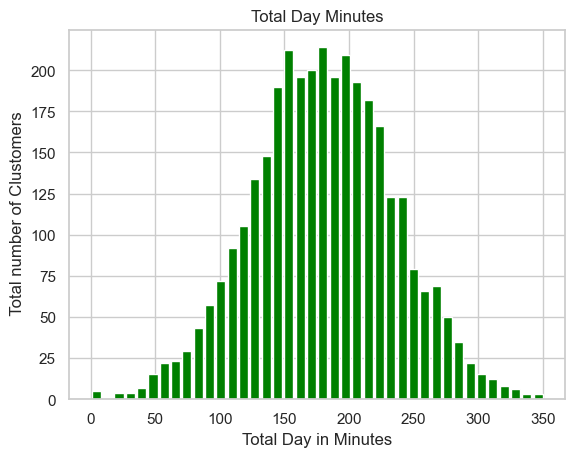

In [60]:
# customers calling in one day
# checking errors by using boxplot 
df[['total day minutes']]
plt.hist(df['total day minutes'],bins=40,rwidth=0.8, color="green")
plt.title("Total Day Minutes")
plt.xlabel("Total Day in Minutes")
plt.ylabel(" Total number of Clustomers")
plt.show()

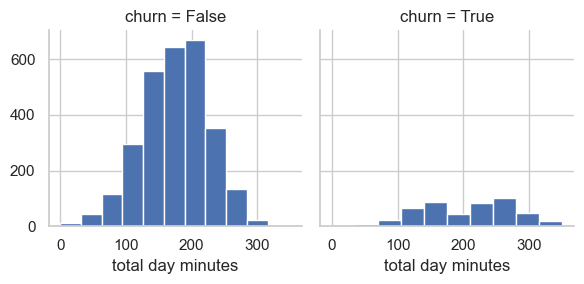

In [61]:
# categorize the churner and non churner for the time spent on day calls(total day minutes)

dmin=sns.FacetGrid(df, col='churn')
dmin.map(plt.hist,'total day minutes')


In [62]:
df['voice mail plan'].value_counts()

voice mail plan
no     2411
yes     922
Name: count, dtype: int64

AttributeError: 'numpy.bool_' object has no attribute 'startswith'

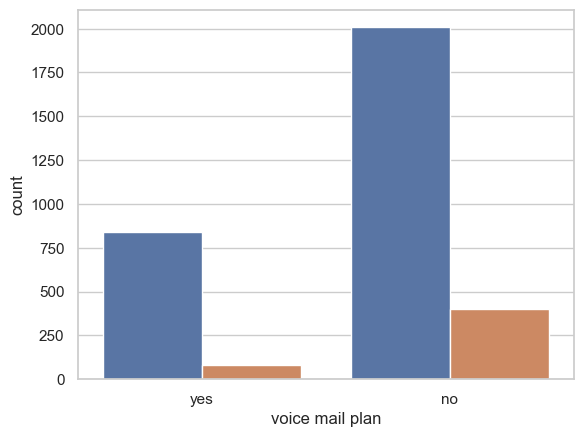

In [63]:
# checking how many peoples are using voice plan
sns.set(style="whitegrid",color_codes=True)
sns.countplot(x='voice mail plan',hue='churn',data=df)

0        no
1        no
2        no
3       yes
4       yes
       ... 
3328     no
3329     no
3330     no
3331    yes
3332     no
Name: international plan, Length: 3333, dtype: object

0       415
1       415
2       415
3       408
4       415
       ... 
3328    415
3329    415
3330    510
3331    510
3332    415
Name: area code, Length: 3333, dtype: int64

<Axes: xlabel='international plan', ylabel='area code'>

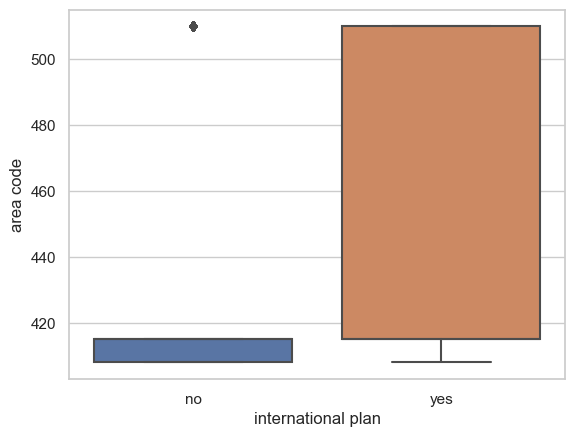

In [64]:
# international plan and continue area 
display(df['international plan'],
        df['area code'])
sns.boxplot(x='international plan',y = 'area code',data=df)

In [65]:
# find the churner and non-churner by area code
crosstab=pd.crosstab(df['area code'],df['voice mail plan'])
crosstab

voice mail plan,no,yes
area code,,
408,618,220
415,1184,471
510,609,231


In [73]:
# creating the pivot table 
pivot=pd.pivot_table(df,index=['area code','voice mail plan'], columns=['international plan'],aggfunc=len)
pivot

account length      churn       \
international plan                    no  yes    no  yes   
area code voice mail plan                                  
408       no                         567   51   567   51   
          yes                        200   20   200   20   
415       no                        1082  102  1082  102   
          yes                        423   48   423   48   
510       no                         531   78   531   78   
          yes                        207   24   207   24   

                          customer service calls      number vmail messages  \
international plan                            no  yes                    no   
area code voice mail plan                                                     
408       no                                 567   51                   567   
          yes                                200   20                   200   
415       no                                1082  102                  1082   
          yes                                423   48                   423   
510       no                                 531   78                   531   
          yes                                207   24                   207   

                               phone number       ... total intl charge       \
international plan         yes           no  yes  ...                no  yes   
area code voice mail plan                         ...                          
408       no                51          567   51  ...               567   51   
          yes               20          200   20  ...               200   20   
415       no               102         1082  102  ...              1082  102   
          yes               48          423   48  ...               423   48   
510       no                78          531   78  ...               531   78   
          yes               24          207   24  ...               207   24   

                          total intl minutes      total night calls       \
international plan                        no  yes                no  yes   
area code voice mail plan                                                  
408       no                             567   51               567   51   
          yes                            200   20               200   20   
415       no                            1082  102              1082  102   
          yes                            423   48               423   48   
510       no                             531   78               531   78   
          yes                            207   24               207   24   

                          total night charge      total night minutes       
international plan                        no  yes                  no  yes  
area code voice mail plan                                                   
408       no                             567   51                 567   51  
          yes                            200   20                 200   20  
415       no                            1082  102                1082  102  
          yes                            423   48                 423   48  
510       no                             531   78                 531   78  
          yes                            207   24                 207   24  

[6 rows x 36 columns]

In [74]:
# total international minutes
pd.pivot_table(df,'total intl minutes', index=['area code', 'voice mail plan'],columns=['international plan'])

international plan                no        yes
area code voice mail plan                      
408       no               10.087302  10.821569
          yes              10.000500  10.720000
415       no               10.287061  10.605882
          yes              10.327896  11.193750
510       no               10.189642  10.167949
          yes               9.943961  10.600000

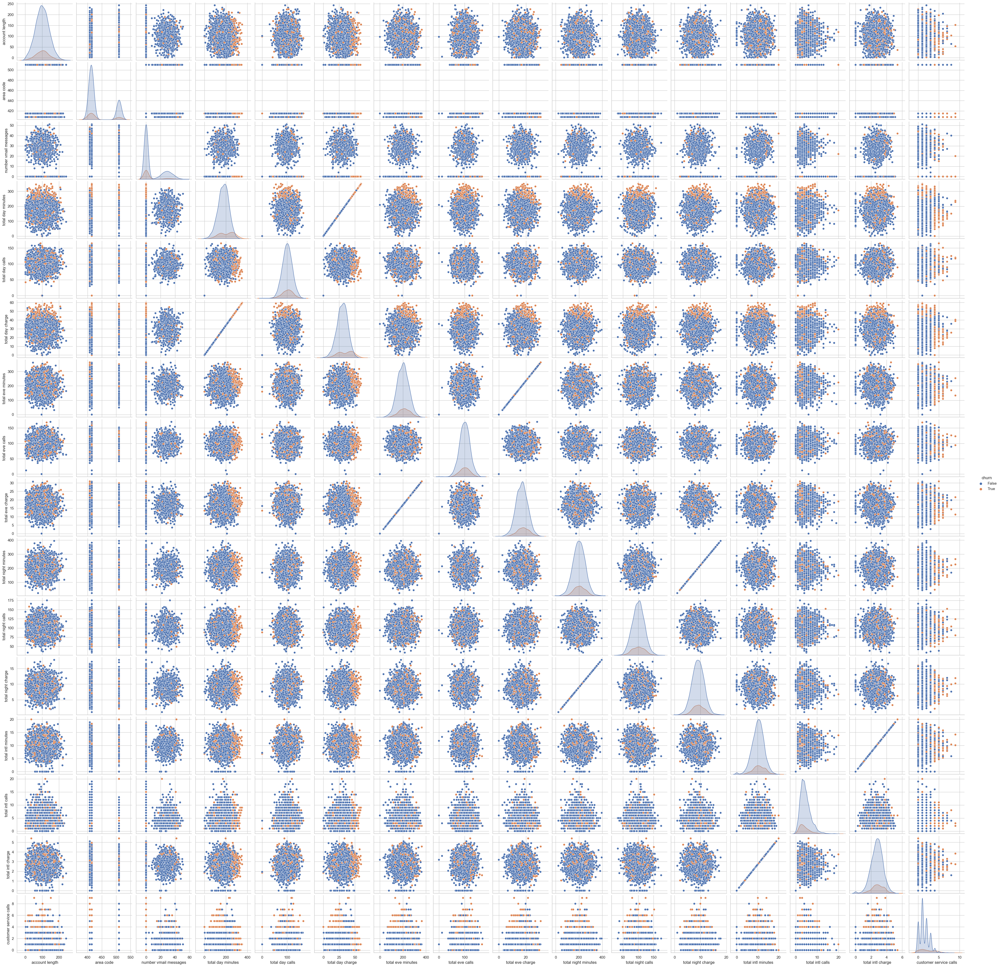

In [77]:
# checking correlation between them
sns.pairplot(df,hue= 'churn')

In [80]:
# mean standard deviation of total night calls
df['total night calls'].std()

19.568609346058615

<Axes: xlabel='total night calls', ylabel='Density'>

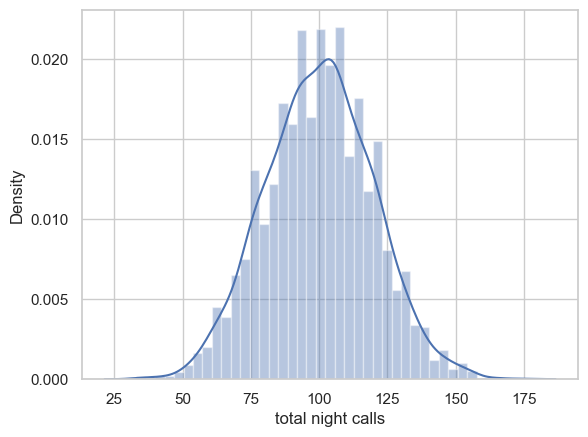

In [79]:
sns.distplot(df['total night calls'])

array([<Axes: title={'center': 'False'}>,
       <Axes: title={'center': 'True'}>], dtype=object)

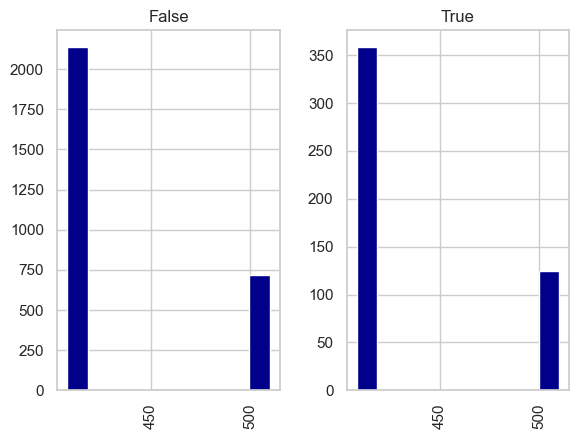

In [87]:
# split the data on the basis of area code
df.hist(by='churn',color="darkblue",column='churn')

AttributeError: 'bool' object has no attribute 'startswith'

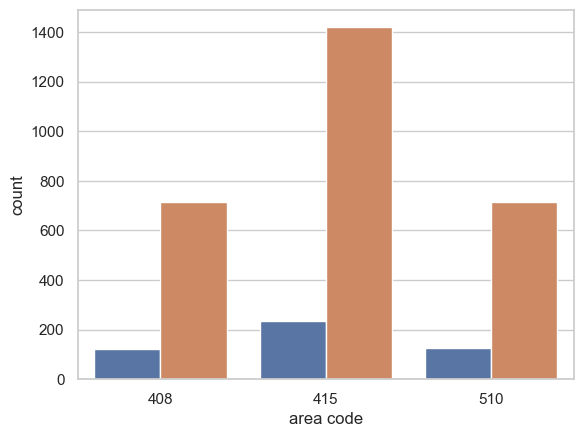

In [139]:
# checking area wise churner and non-churner 
df['area code'].astype('category')
sns.countplot(x= "area code",data=df,hue="churn",hue_order=[True,False])